<a href="https://colab.research.google.com/github/HimasagarU/AttentionEEG/blob/main/First_Analysis/analysis2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and import Libraries, Datasets and clone git repo


In [2]:
#@title Run this cell and the cells below. This might take a few minutes.
%%capture
%pip install scipy
%pip install seaborn
%pip install mne
import mne
import numpy as np
%matplotlib inline

# System Imports
import os
from glob import glob
from collections import OrderedDict
import warnings
warnings.filterwarnings('ignore')

# Common Imports
import pandas as pd
import numpy as np

# MNE: EEG Analysis Library
from mne import Epochs,find_events

# Specific MNE Imports
from mne import create_info, concatenate_raws
from mne.io import RawArray
from mne.channels import make_standard_montage
from mne.preprocessing import ICA

# Install some necessary packages
!pip install psychopy brainflow
!apt install xvfb -y
!pip install pyvirtualdisplay
!pip install piglet

# Set up virtual display
# (Source: https://colab.research.google.com/drive/1tug_bpg8RwrFOI8C6Ed-zo0OgD3yfnWy)
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()
import os
if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0:
    !bash ../xvfb start
    %env DISPLAY=:1

!pip install pyriemann
# from sklearn.pipeline import make_pipeline

# from mne.decoding import Vectorizer

# from sklearn.linear_model import LogisticRegression
# from sklearn.preprocessing import StandardScaler
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit

# from pyriemann.estimation import ERPCovariances, XdawnCovariances
# from pyriemann.tangentspace import TangentSpace
# from pyriemann.classification import MDM

from collections import OrderedDict


import seaborn as sns
from matplotlib import pyplot as plt

%matplotlib inline

In [3]:
#@title Import dataset folder from gdrive
%pip install --upgrade gdown

import gdown

# Replace with the ID of your shared Google Drive folder
folder_id = '133jyRxBuRK0g9YjEED2Vj5qowAdfTNhg'

# List all files in the folder
!gdown --folder {folder_id} --fuzzy

Retrieving folder contents
Processing file 1IpgG1E5o0JBpCnaYwGyG6T7rV6w1S6Xn First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv
Processing file 1Rsbezo1RjtH8cGw7fcFbtf52fjRO2FQc First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.json
Processing file 15PV9VvtQNBtA16iB7qlqFlwTLweAxyRv First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.mc.pm.fe.bp.csv
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1IpgG1E5o0JBpCnaYwGyG6T7rV6w1S6Xn
To: /content/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv
100% 3.08k/3.08k [00:00<00:00, 9.71MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Rsbezo1RjtH8cGw7fcFbtf52fjRO2FQc
To: /content/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.json
100% 29.1k/29.1k [00:00<00:00, 31.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=15PV9VvtQNBtA16iB7qlqFlwTLweAxyRv

In [5]:
!git clone https://github.com/HimasagarU/AttentionEEG.git
%cd /content/AttentionEEG
!ls /content/AttentionEEG/First_Analysis/

Cloning into 'AttentionEEG'...
remote: Enumerating objects: 81, done.
remote: Counting objects: 100% (81/81), done.
remote: Compressing objects: 100% (65/65), done.
remote: Total 81 (delta 28), reused 29 (delta 12), pack-reused 0 (from 0)
Receiving objects: 100% (81/81), 10.66 MiB | 11.65 MiB/s, done.
Resolving deltas: 100% (28/28), done.
/content/AttentionEEG
analysis1.ipynb
analysis2.ipynb
AttentionEEG
First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv
First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.json
First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.mc.pm.fe.bp.csv
GithubPAT.txt


# Step 1: Loading and Readying the Data to create raw data


In [124]:
#@title Load the marker CSV file
marker_df = pd.read_csv('/content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv')
marker_df.head(3)

,latency,duration,type,marker_value,key,timestamp,marker_id
0,3.720729,19.992604,Eyes_Opened,1,-1,1.727084e+09,1
1,28.878264,20.001177,Eyes_Closed,3,-1,1.727084e+09,2
2,58.112798,0.000000,lab_start,10,10,1.727084e+09,3


In [126]:
#@title Load the EEG data
eeg_data = pd.read_csv('/content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.mc.pm.fe.bp.csv',skiprows=1,header=0)
print(eeg_data['MarkerValueInt'].value_counts())
eeg_data_df = eeg_data[['Timestamp', 'MarkerValueInt', 'EEG.Counter', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5',
                        'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4',
                        'EEG.F8', 'EEG.AF4']]
eeg_data_df = eeg_data_df.rename(columns={'Timestamp': 'timestamp'})
eeg_data_df.head(4)

MarkerValueInt
109.0    19
110.0    19
32.0      4
1.0       2
3.0       2
10.0      2
31.0      2
Name: count, dtype: int64


,timestamp,MarkerValueInt,EEG.Counter,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,EEG.O2,EEG.P8,EEG.T8,EEG.FC6,EEG.F4,EEG.F8,EEG.AF4
0,1.727084e+09,NaN,27.0,4331.922852,4295.512695,4340.000000,4332.948730,4293.205078,4286.538574,4295.641113,4293.589844,4279.358887,4270.384766,4498.333496,4497.692383,4426.410156,4494.487305
1,1.727084e+09,NaN,28.0,4335.000000,4298.333496,4341.666504,4335.641113,4292.179688,4289.615234,4296.153809,4295.512695,4281.410156,4276.282227,4505.897461,4503.333496,4435.641113,4500.384766
2,1.727084e+09,NaN,29.0,4337.563965,4303.077148,4342.948730,4339.487305,4292.820313,4291.025879,4296.666504,4298.461426,4283.077148,4281.153809,4514.487305,4509.358887,4443.846191,4506.922852
3,1.727084e+09,NaN,30.0,4339.743652,4307.051270,4344.102539,4342.179688,4293.846191,4288.077148,4296.666504,4301.666504,4284.487305,4283.974121,4521.666504,4513.333496,4447.948730,4512.051270


In [6]:
#@title Filling MarkerValueInt column in dataframe with previous Value
eeg_data_df['MarkerValueInt'] = eeg_data_df['MarkerValueInt'].ffill()
eeg_data_df['MarkerValueInt'].value_counts()

,count
MarkerValueInt,
32.0,65634
110.0,20599
109.0,18770
31.0,16593
3.0,7488
1.0,6444
10.0,3040


In [10]:
#@title The marker value and corresponding type
print(marker_df[['marker_value','type']].value_counts())

marker_value  type           
109           reading_ques       19
110           Thinking_answer    19
32            eyes_open           4
10            lab_start           2
31            eye_close           2
1             Eyes_Opened         1
3             Eyes_Closed         1
Name: count, dtype: int64


We are concerned only with marker values 32, 109, 110 which are respectively eyes_open(reading_text_data), reading_ques, Thinking_answer

In [11]:
#@title Grouping data based on marker value
grouped_eeg_data = eeg_data_df.groupby('MarkerValueInt')

In [13]:
#@title ReadingText data
reading_text_data = grouped_eeg_data.get_group(32)
print(reading_text_data.shape)
reading_text_data.info()

(65634, 17)
<class 'pandas.core.frame.DataFrame'>
Index: 65634 entries, 17925 to 83558
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   timestamp       65634 non-null  float64
 1   MarkerValueInt  65634 non-null  float64
 2   EEG.Counter     65634 non-null  float64
 3   EEG.AF3         65634 non-null  float64
 4   EEG.F7          65634 non-null  float64
 5   EEG.F3          65634 non-null  float64
 6   EEG.FC5         65634 non-null  float64
 7   EEG.T7          65634 non-null  float64
 8   EEG.P7          65634 non-null  float64
 9   EEG.O1          65634 non-null  float64
 10  EEG.O2          65634 non-null  float64
 11  EEG.P8          65634 non-null  float64
 12  EEG.T8          65634 non-null  float64
 13  EEG.FC6         65634 non-null  float64
 14  EEG.F4          65634 non-null  float64
 15  EEG.F8          65634 non-null  float64
 16  EEG.AF4         65634 non-null  float64
dtypes: float64(17)
memor

## Creating info and Raw data

In [14]:
sampling_rate = 256
ch_names = ['EEG.AF3','EEG.F7','EEG.F3','EEG.FC5','EEG.T7','EEG.P7','EEG.O1','EEG.O2','EEG.P8','EEG.T8','EEG.FC6','EEG.F4','EEG.F8','EEG.AF4']
clean_ch_names = [ch.replace('EEG.', '') for ch in ch_names]
clean_ch_names

['AF3',
 'F7',
 'F3',
 'FC5',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'FC6',
 'F4',
 'F8',
 'AF4']

In [15]:
n_channels = len(clean_ch_names)
print(n_channels)
reading_text_data2 = reading_text_data.iloc[:,3:17].to_numpy().T
reading_text_data2.shape

14


(14, 65634)

In [42]:
info = mne.create_info(clean_ch_names, sfreq=sampling_rate, ch_types=['eeg']*n_channels)
raw = mne.io.RawArray(reading_text_data2, info)
raw.set_eeg_reference('average', projection=True)
print(reading_text_data2.shape)  # Should be (n_channels, n_times)
print(len(ch_names))
print(raw.info)

Creating RawArray with float64 data, n_channels=14, n_times=65634
    Range : 0 ... 65633 =      0.000 ...   256.379 secs
Ready.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
(14, 65634)
14
<Info | 8 non-empty values
 bads: []
 ch_names: AF3, F7, F3, FC5, T7, P7, O1, O2, P8, T8, FC6, F4, F8, AF4
 chs: 14 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: unspecified
 nchan: 14
 projs: Average EEG reference: off
 sfreq: 256.0 Hz
>


<function matplotlib.pyplot.show(close=None, block=None)>

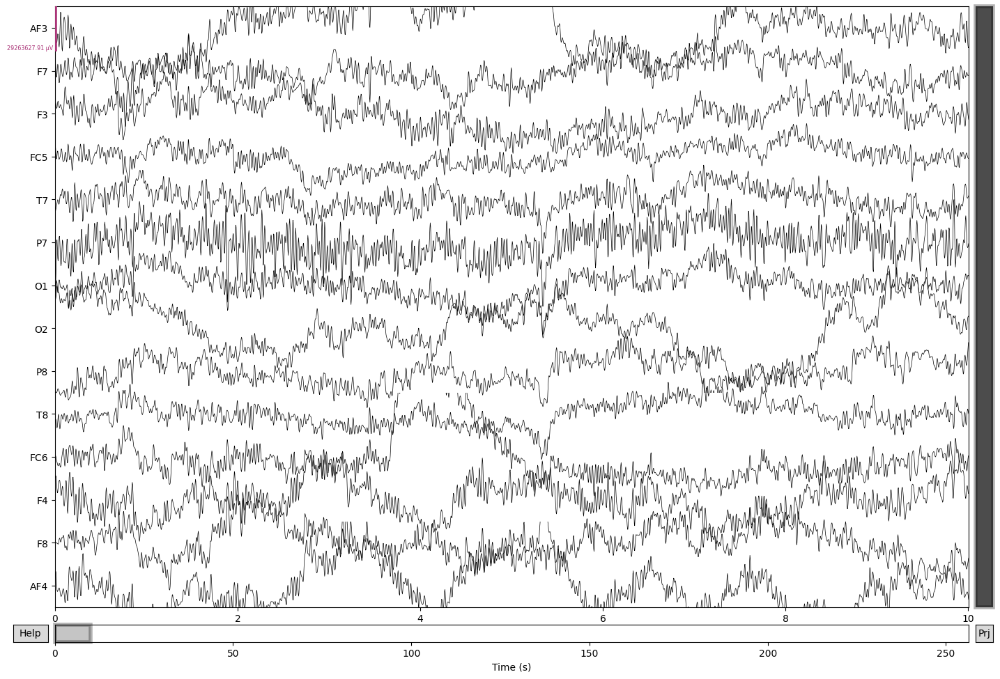

In [44]:
fig = raw.plot(scalings = 'auto', show=False)
fig.set_size_inches(15, 10)
plt.show

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


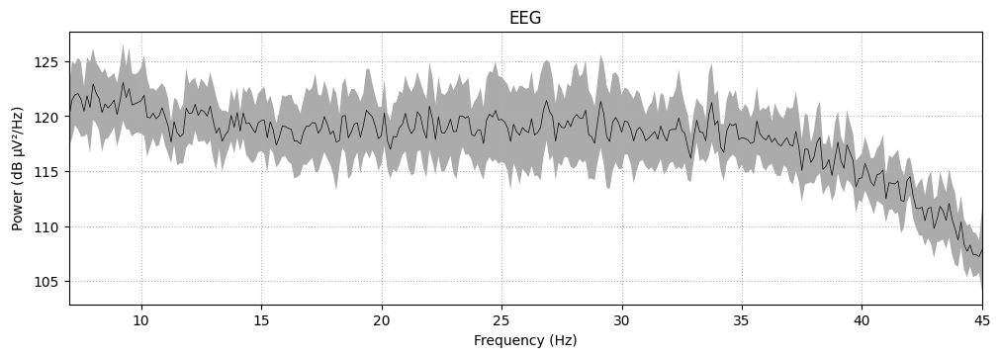

In [52]:
raw.plot_psd(tmin=0, tmax=60, fmin=7, fmax=45, average=True, spatial_colors=False);

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 7 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 423 samples (1.652 s)

Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


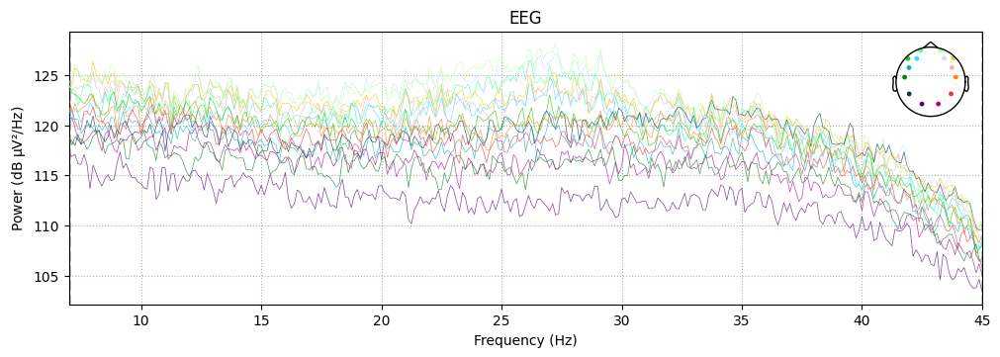

In [74]:
raw_filtered = raw.copy().filter(l_freq=7, h_freq=45)
raw_filtered.compute_psd(fmin=7, fmax=45).plot();

In [75]:
montage = mne.channels.make_standard_montage('standard_1020')
raw.rename_channels(mapping= lambda name: name.replace(".",""))
raw.set_montage(montage, match_case=False)

<RawArray | 14 x 65634 (256.4 s), ~7.0 MB, data loaded>

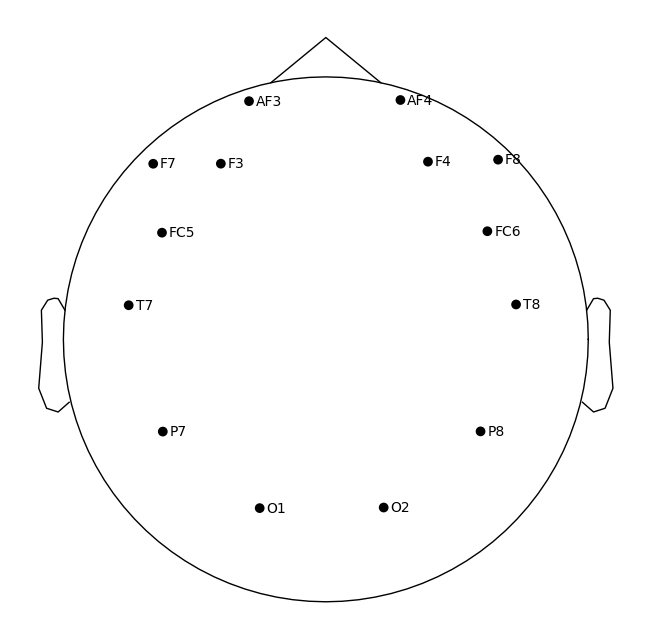

In [76]:
raw.plot_sensors(show_names=True);

In [77]:
num_components = 14
ica = ICA(n_components=num_components, method='fastica')
ica.fit(raw_filtered)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components
Fitting ICA took 6.4s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,28 iterations on raw data (65634 samples)
ICA components,14
Available PCA components,14
Channel types,eeg
ICA components marked for exclusion,—


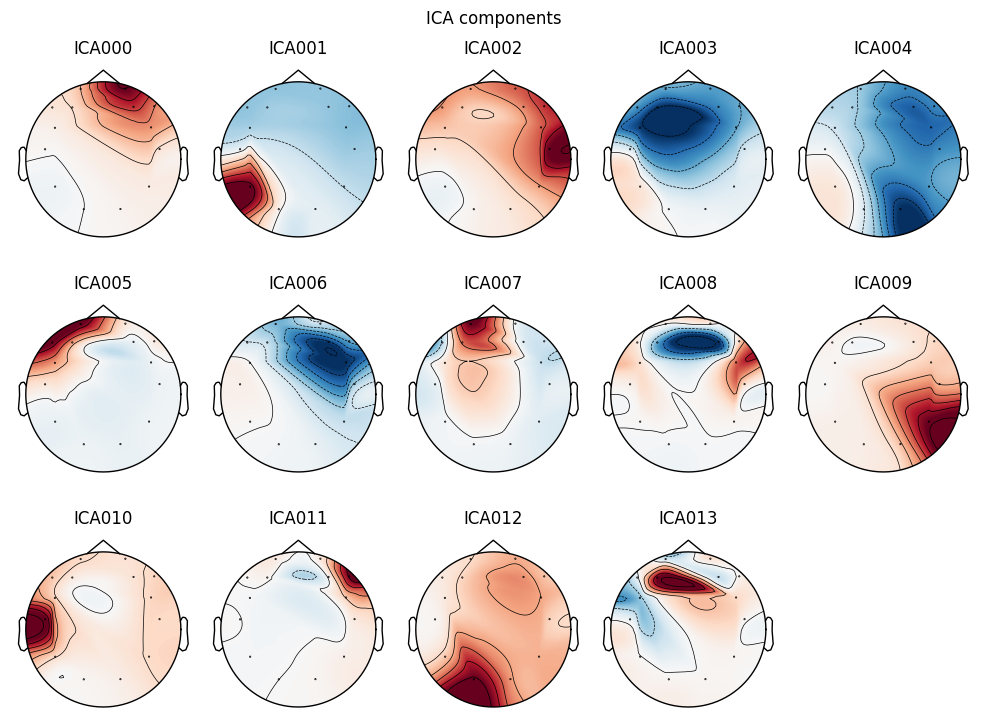

In [78]:
ica.plot_components();

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 pro

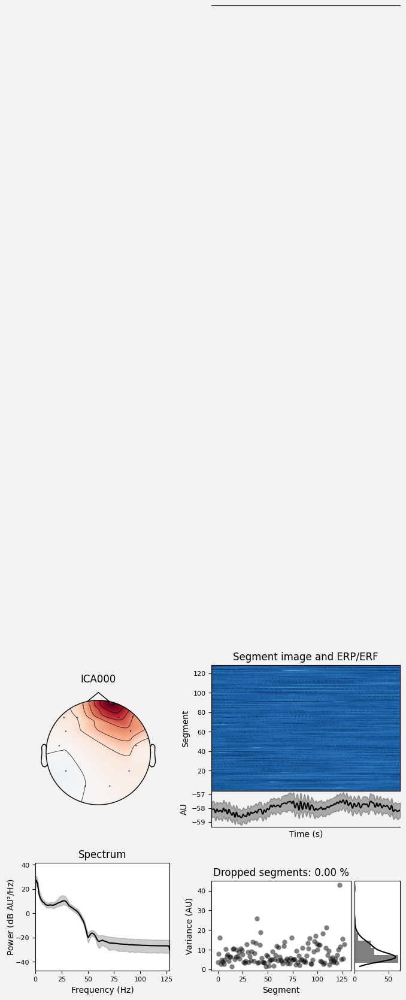

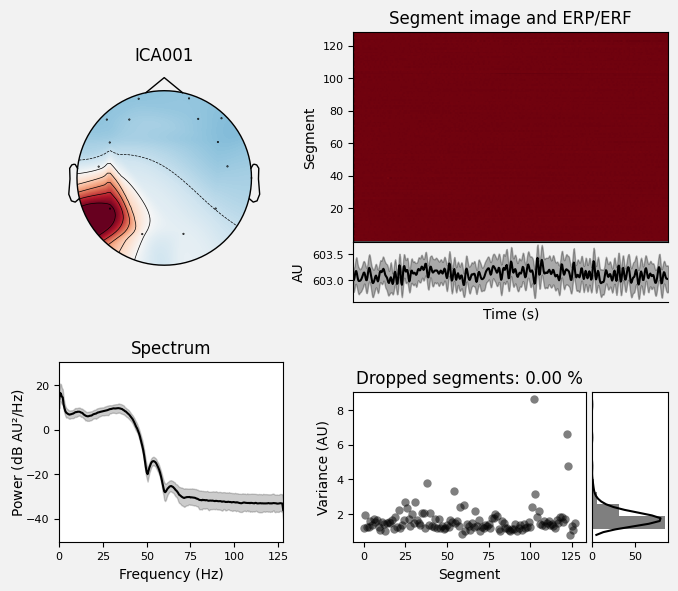

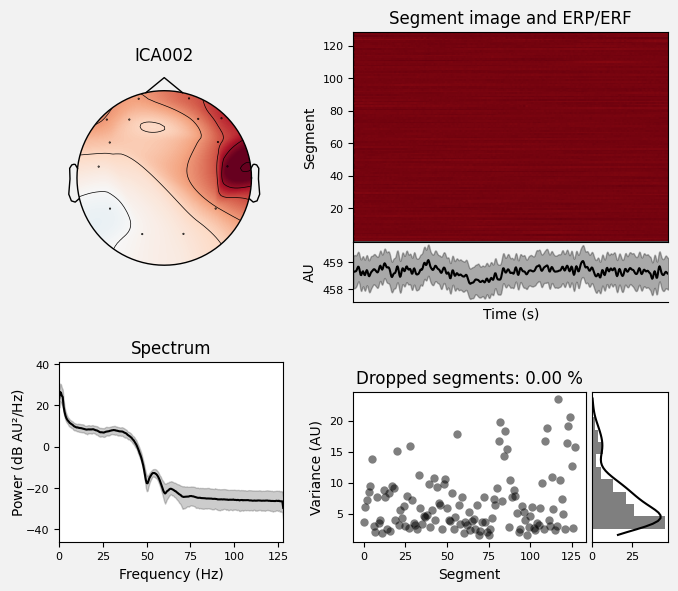

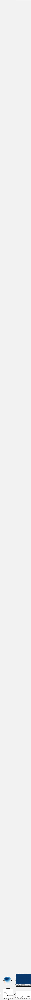

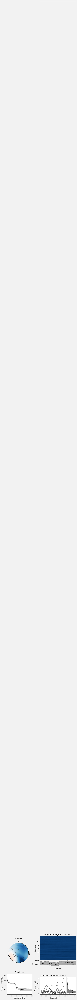

...

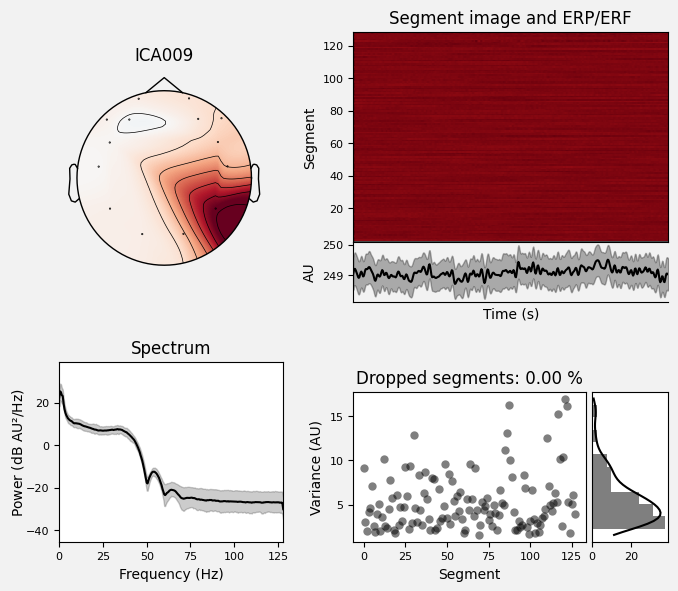

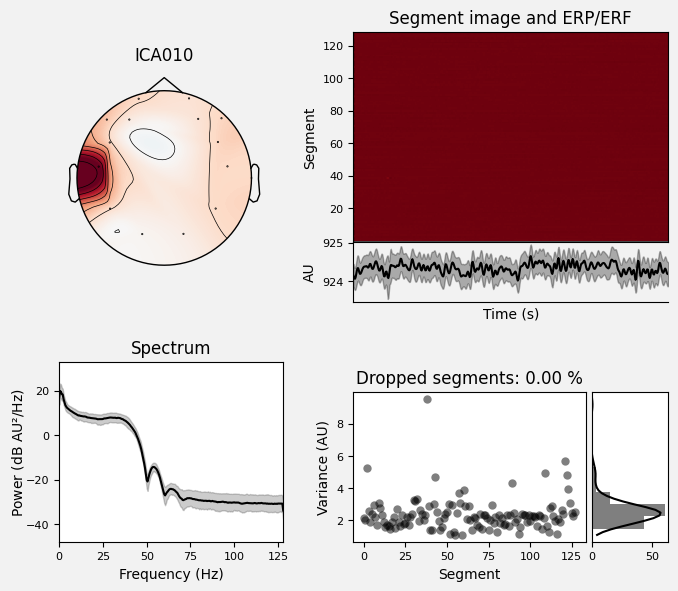

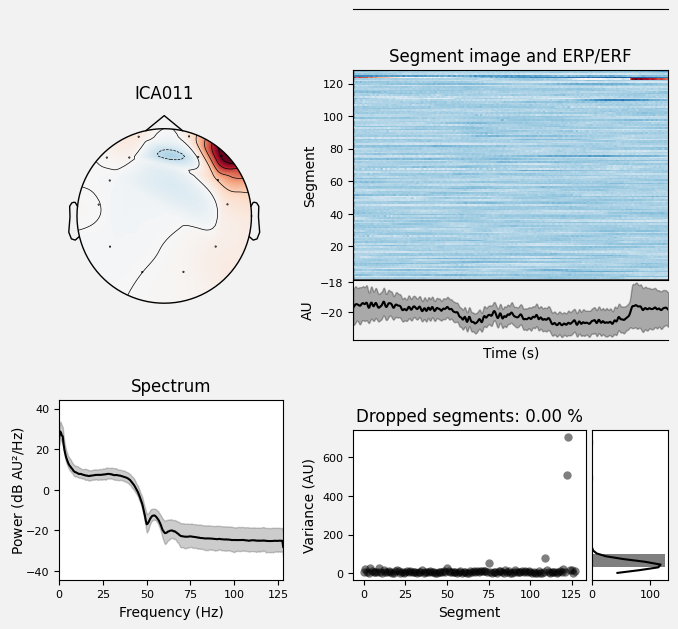

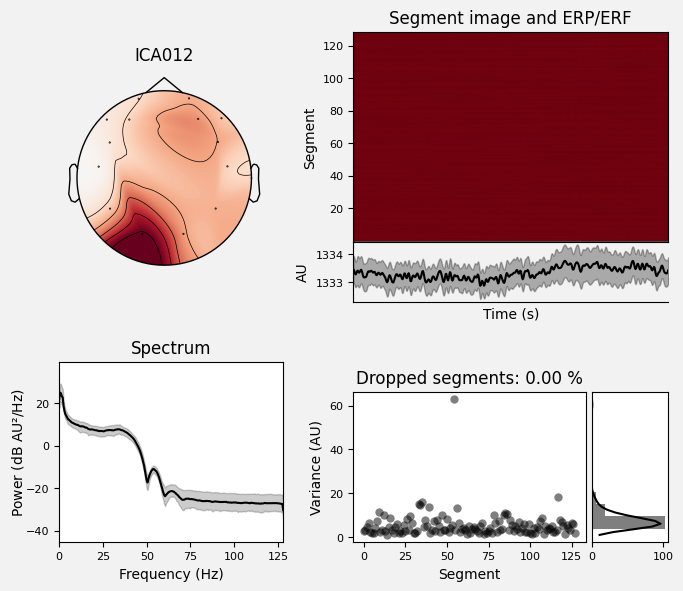

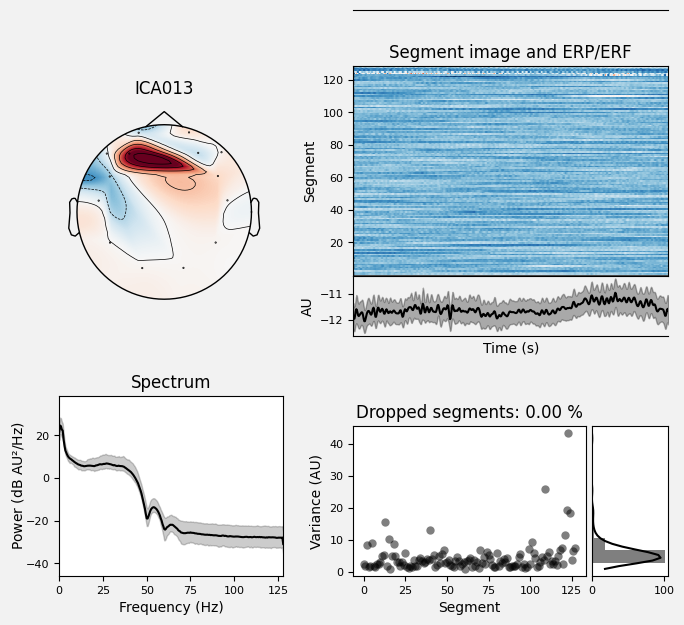

In [79]:
ica.plot_properties(raw, picks=range(num_components));

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


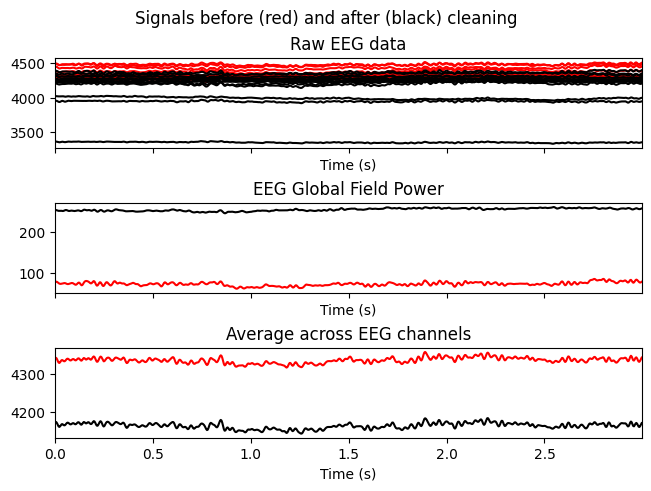

In [80]:
ica.plot_overlay(raw, exclude=[9]);

# Frequency Domain Analysis

In [85]:
%%capture
%pip install mne pywavelets matplotlib

In [86]:
import pywt

In [90]:
data, sfreq = raw_filtered.get_data(return_times=False), raw.info['sfreq']
ch_names = raw_filtered.info['ch_names']

In [91]:
# Define a function for plotting
def plot_power_spectrum(freqs, power, title):
    plt.figure()
    plt.plot(freqs, power)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.show()

# 1. Fourier Transform (FT)
def fourier_transform(data, sfreq, ch):
    freqs = np.fft.fftfreq(len(data[ch]), 1/sfreq)
    ft = np.fft.fft(data[ch])
    power = np.abs(ft) ** 2
    plot_power_spectrum(freqs, power, f"Fourier Transform - {ch_names[ch]}")

# 2. Fast Fourier Transform (FFT)
def fast_fourier_transform(data, sfreq, ch):
    freqs = np.fft.rfftfreq(len(data[ch]), 1/sfreq)
    fft = np.fft.rfft(data[ch])
    power = np.abs(fft) ** 2
    plot_power_spectrum(freqs, power, f"Fast Fourier Transform (FFT) - {ch_names[ch]}")

# 3. Discrete Wavelet Transform (DWT)
def discrete_wavelet_transform(data, ch, wavelet='db4'):
    coeffs = pywt.wavedec(data[ch], wavelet)
    plt.figure()
    plt.title(f"Discrete Wavelet Transform (DWT) - {ch_names[ch]}")
    for i, coeff in enumerate(coeffs):
        plt.subplot(len(coeffs), 1, i + 1)
        plt.plot(coeff)
        plt.title(f"Detail Coefficients - Level {i + 1}")
    plt.tight_layout()
    plt.show()

# 4. Continuous Wavelet Transform (CWT)
def continuous_wavelet_transform(data, sfreq, ch, wavelet='cmor'):
    scales = np.arange(1, 128)
    coef, freqs = pywt.cwt(data[ch], scales, wavelet, sampling_period=1/sfreq)
    plt.imshow(np.abs(coef), extent=[0, len(data[ch])/sfreq, freqs.min(), freqs.max()],
               aspect='auto', cmap='jet')
    plt.title(f"Continuous Wavelet Transform (CWT) - {ch_names[ch]}")
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.show()

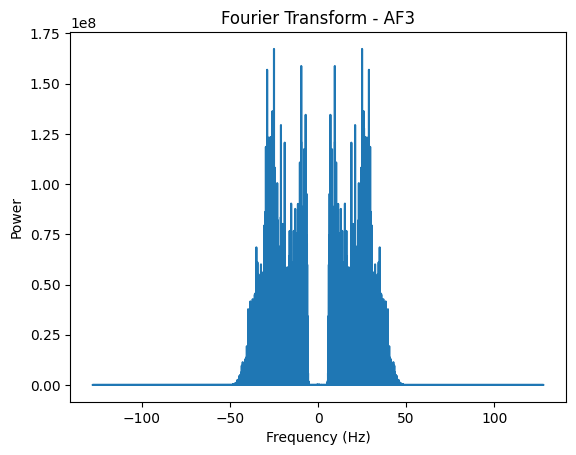

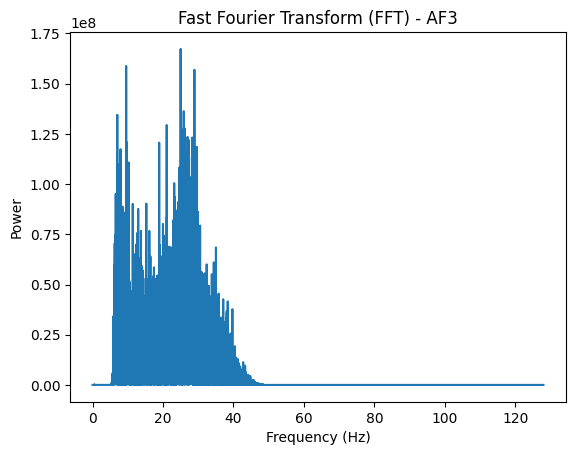

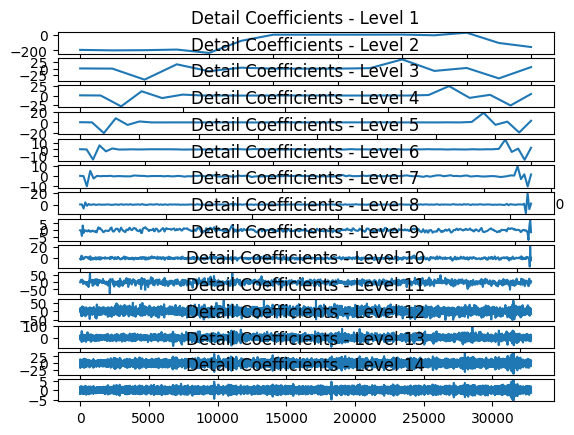

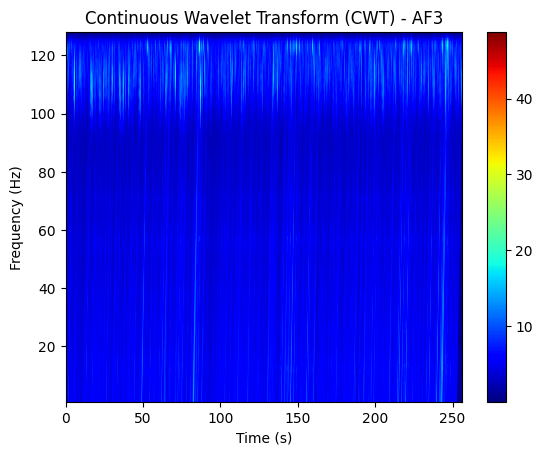

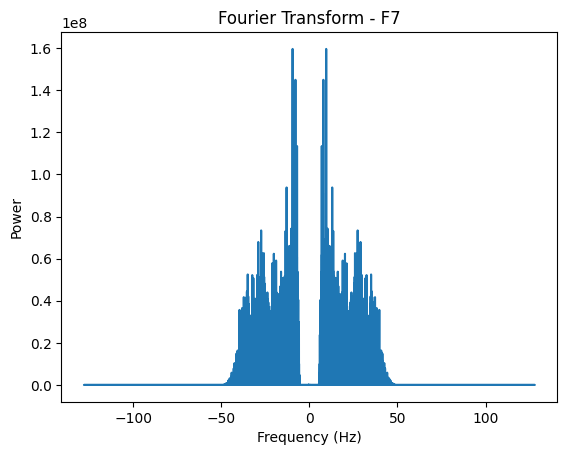

...

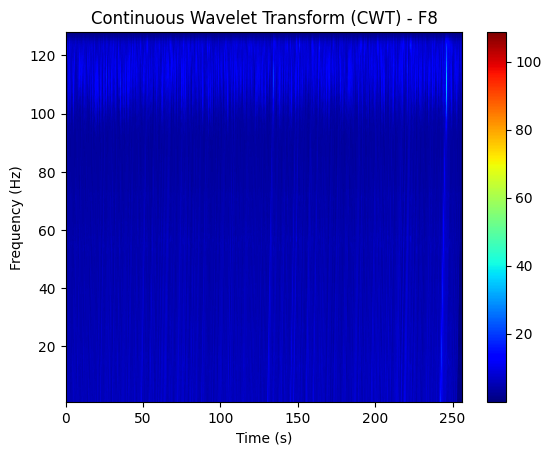

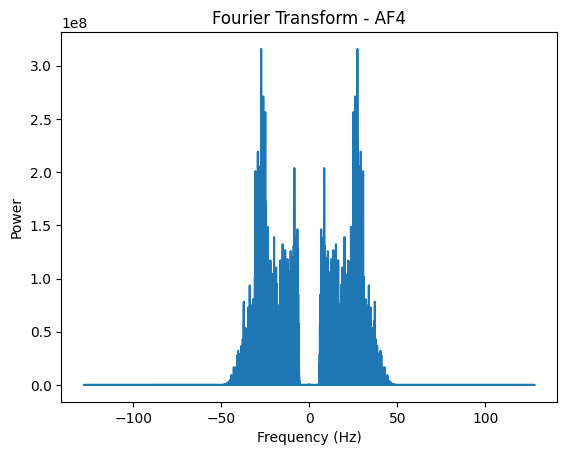

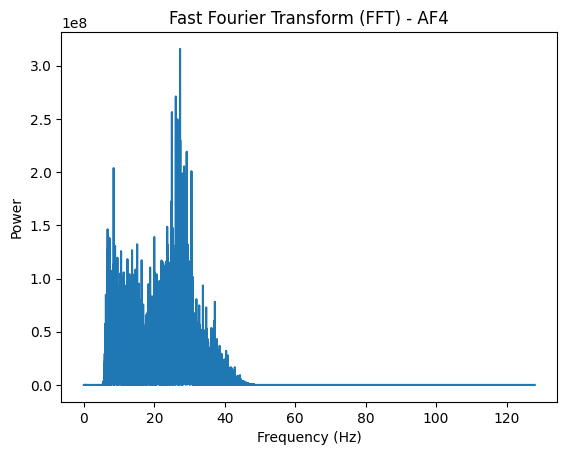

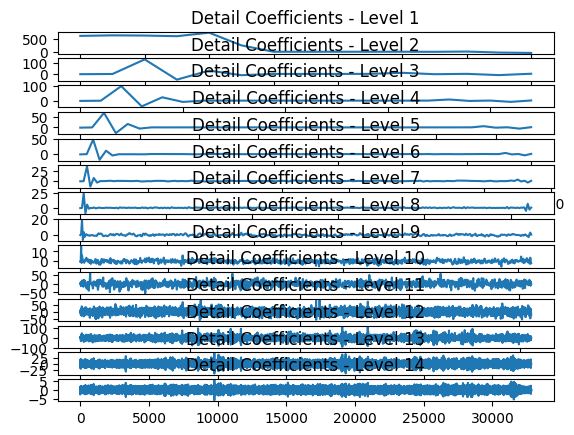

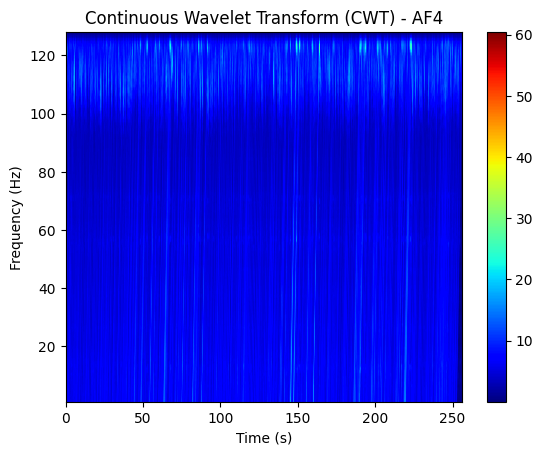

In [92]:
for ch in range(14):  # Loop over the 14 channels
    # Fourier Transform
    fourier_transform(data, sfreq, ch)

    # Fast Fourier Transform (FFT)
    fast_fourier_transform(data, sfreq, ch)

    # Discrete Wavelet Transform (DWT)
    discrete_wavelet_transform(data, ch)

    # Continuous Wavelet Transform (CWT)
    continuous_wavelet_transform(data, sfreq, ch)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 7 - 12 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 12.00 Hz
- Upper transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 13.50 Hz)
- Filter length: 1651 samples (1.651 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 12 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 12.00
- Lower transition bandwidth: 3.00 Hz (-6 dB cutoff frequency: 10.50 Hz)
- Upper passband edge

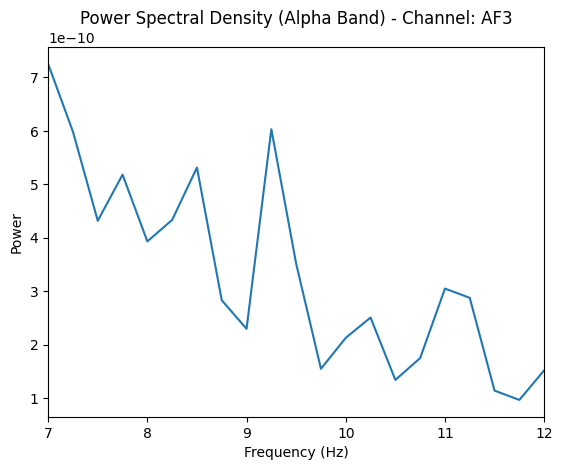

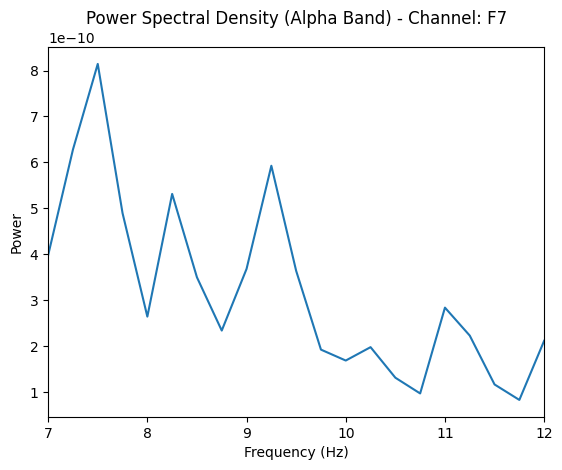

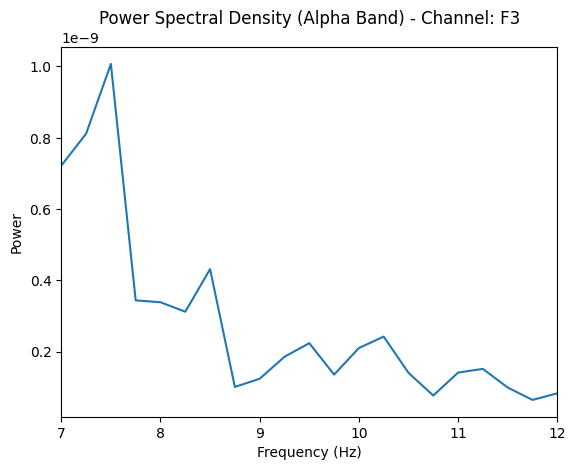

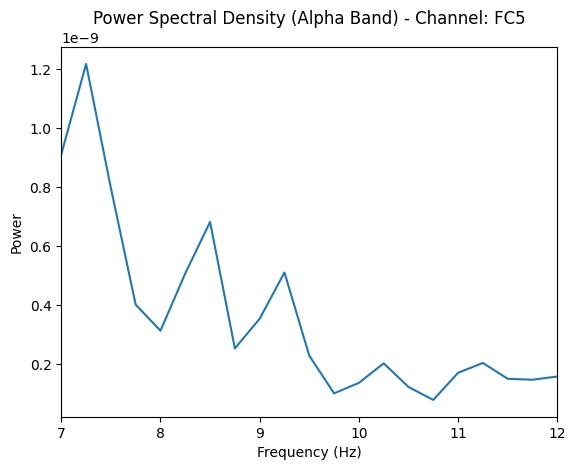

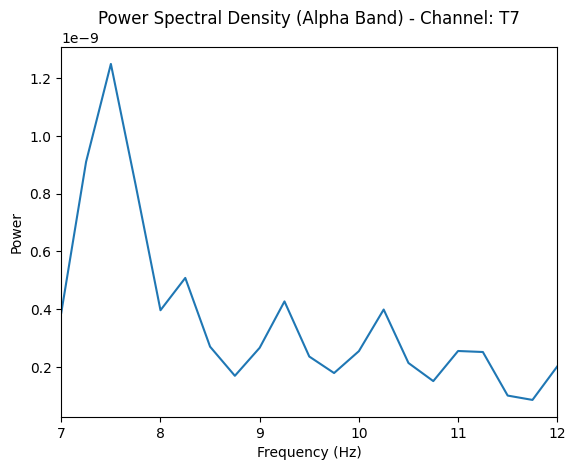

...

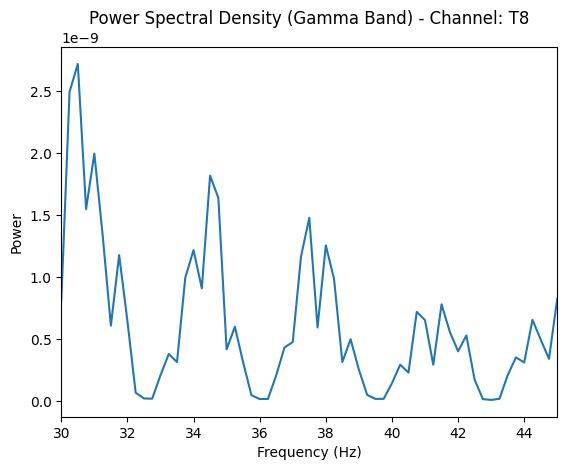

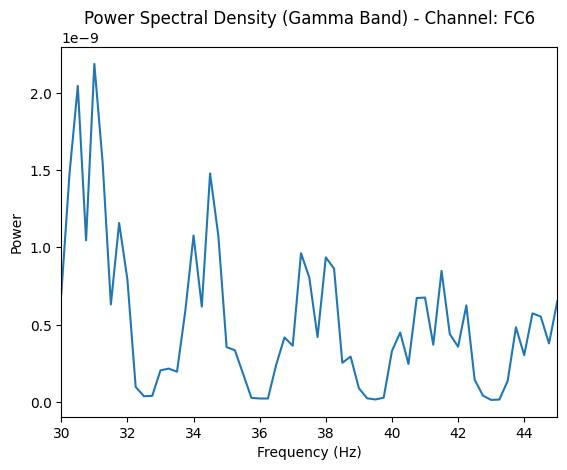

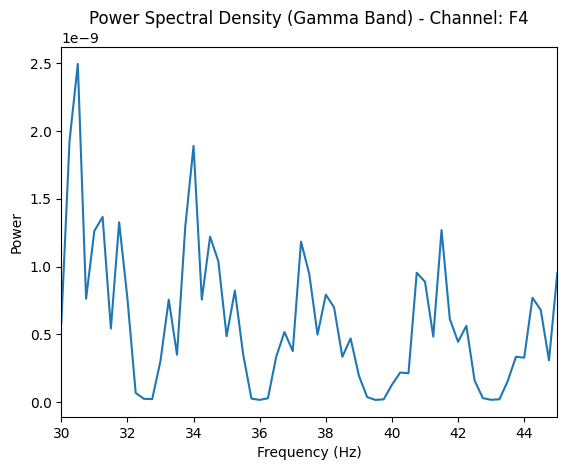

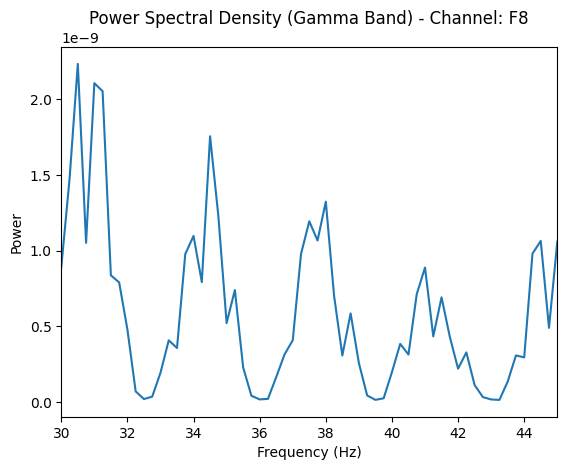

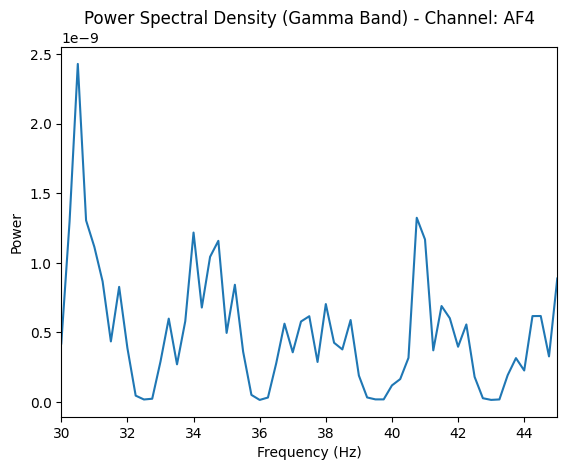

In [116]:
from scipy.stats import ttest_rel
from scipy import signal
import matplotlib.pyplot as plt

# Define the brainwave bands
bands = {
    'Alpha': (7, 12),
    'Beta': (12, 30),
    'Gamma': (30, 45)
}

# Function to filter the data for each band
def bandpass_filter(raw, l_freq, h_freq):
    filtered_data = raw.copy().filter(l_freq=l_freq, h_freq=h_freq, fir_design='firwin')
    return filtered_data.get_data()

# Power Spectral Density (PSD) using Welch's method
def compute_psd(data, sfreq):
    freqs, psd = signal.welch(data, sfreq, nperseg=1024)
    return freqs, psd

# Function to analyze EEG data for each band and compute the PSD
def analyze_bands(raw, sfreq):
    band_psd = {}
    for band_name, (low, high) in bands.items():
        # Filter for each band
        filtered_data = bandpass_filter(raw, low, high)

        # Compute PSD for each channel
        psd_all_ch = []
        freqs_all_ch = []
        for ch in range(filtered_data.shape[0]):
            freqs, psd = compute_psd(filtered_data[ch], sfreq)
            psd_all_ch.append(psd)
            freqs_all_ch.append(freqs)

        band_psd[band_name] = {
            'psd': np.array(psd_all_ch),
            'freqs': np.array(freqs_all_ch)
        }
    return band_psd

# Function to find indices corresponding to the frequency range for each band
def get_band_indices(freqs, low, high):
    return np.where((freqs >= low) & (freqs <= high))[0]

# Function to plot PSD for each band, limited to the correct frequency range
def plot_psd_with_limit(psd, freqs, band_name, low_freq, high_freq, channel, ch_name):
    # Get the indices of the frequencies that fall within the desired band
    band_indices = get_band_indices(freqs[channel], low_freq, high_freq)

    # Plot PSD for the selected frequency range and channel
    plt.plot(freqs[channel][band_indices], psd[channel][band_indices])
    plt.title(f'Power Spectral Density ({band_name} Band) - Channel: {ch_name}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.xlim(low_freq, high_freq)  # Limit x-axis to the specific band range
    plt.show()

# Function to calculate average band power across all channels
def compute_average_band_power(band_psd, low_freq, high_freq):
    avg_band_power = {}
    for band_name, data in band_psd.items():
        avg_power = []
        for ch in range(data['psd'].shape[0]):
            # Get the indices corresponding to the band
            band_indices = get_band_indices(data['freqs'][ch], low_freq, high_freq)
            # Compute average power for each channel in the band
            avg_power.append(np.mean(data['psd'][ch][band_indices]))
        avg_band_power[band_name] = np.mean(avg_power)  # Compute average across channels
    return avg_band_power

# Function to plot average band powers
def plot_average_band_powers(avg_band_power):
    bands = list(avg_band_power.keys())
    powers = list(avg_band_power.values())

    plt.bar(bands, powers, color=['blue', 'green', 'red'])
    plt.title('Average Band Powers Across All Channels')
    plt.xlabel('Band')
    plt.ylabel('Average Power')
    plt.show()

# Function to perform t-tests on PSD data between two conditions
def perform_ttest(psd1, psd2, band_name):
    t_vals, p_vals = ttest_rel(psd1, psd2, axis=0)
    print(f"T-test results for {band_name} band:")
    print("T-values:", t_vals)
    print("P-values:", p_vals)
    return t_vals, p_vals

sfreq = raw_filtered.info['sfreq']  # Get the sampling frequency
# Analyze EEG data for each band
band_psd = analyze_bands(raw, sfreq)

# Plot the PSD for each band and channel, restricted to the correct frequency range
for band_name, (low_freq, high_freq) in bands.items():
    for ch, ch_name in enumerate(clean_ch_names):
        plot_psd_with_limit(
            band_psd[band_name]['psd'],
            band_psd[band_name]['freqs'],
            band_name,
            low_freq,
            high_freq,
            channel=ch,
            ch_name=ch_name
        )

# Compute average band power across all channels for each band
avg_band_power = compute_average_band_power(band_psd, 7, 45)


In [97]:
# Example: Perform t-test on Alpha band power between two conditions
# Assume condition1_psd and condition2_psd are PSD values from two different conditions
def perform_ttest(psd1, psd2, band_name):
    t_vals, p_vals = ttest_rel(psd1, psd2, axis=0)
    print(f"T-test results for {band_name} band:")
    print("T-values:", t_vals)
    print("P-values:", p_vals)
    return t_vals, p_vals

# Simulate two conditions for illustration (use real data in practice)
condition1_psd = band_psd['Alpha']  # Replace with actual condition 1 data
condition2_psd = band_psd['Beta']  # Replace with actual condition 2 data (e.g., different task)

# Perform t-test for the Alpha band
t_vals, p_vals = perform_ttest(condition1_psd, condition2_psd, 'Alpha')


T-test results for Alpha band:
T-values: [  9.50142888   9.48517547   4.02412022   4.35201248   6.93458412
   7.62764927   7.49423433   7.08549402   7.5781613    7.66447301
   7.73822992   7.40519875   7.26303154   7.65332858   7.58300606
   7.56474187   7.61346706   7.48001008   7.50552183   7.44020712
   7.06544179   7.33952134   6.83627133   6.78040698   6.86460234
   6.90560266   7.22533976   6.5748386    6.85186338   6.5595937
   6.52909646   7.18692665   6.8717013    6.62679115   6.14810361
   6.8531988    6.64363989   6.92654501   6.99135209   7.34014713
   7.68314085   8.11535836   7.29227648   7.9662663    7.62342034
   7.17959802   8.21007503   9.22937182   0.03681883  -6.82529314
  -7.48036691  -7.43195793  -6.91709211  -6.37648823  -6.5104009
  -6.88857561  -6.67018927  -7.21218284  -7.42710117  -7.1711694
  -6.62894081  -6.55676066  -6.62305924  -6.73324099  -6.3794877
  -6.38813267  -7.22543117  -6.70192627  -6.27349805  -6.72022116
  -6.9508956   -6.65237384  -6.56258734

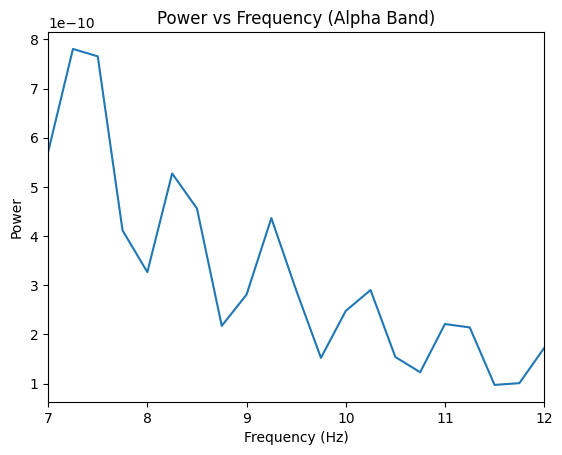

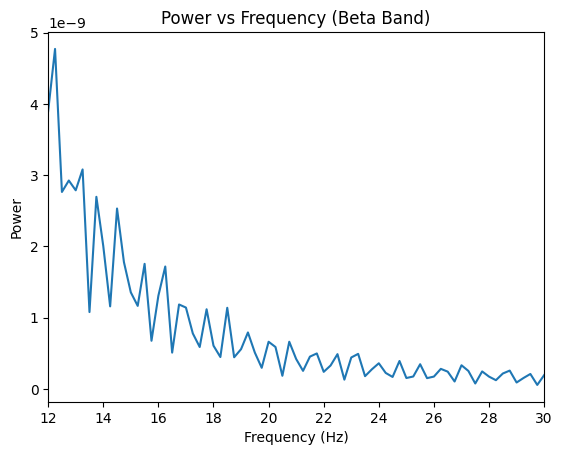

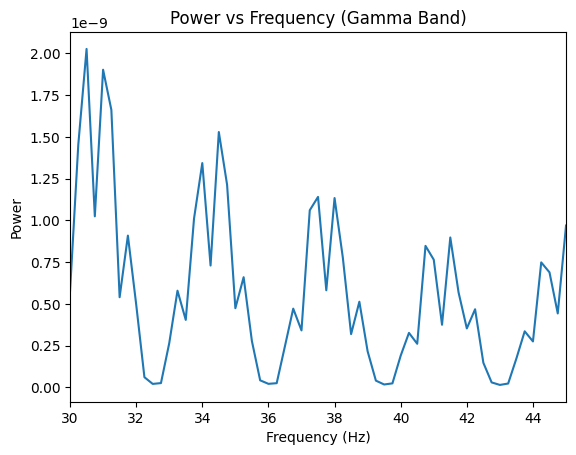

In [103]:
# Function to get frequency indices for a specific band
def get_band_indices(freqs, low, high):
    return np.where((freqs >= low) & (freqs <= high))[0]

# Function to plot averaged power vs frequency for a given band
def plot_avg_psd_band(band_name, band_psd, low_freq, high_freq):
    avg_psd = []
    avg_freqs = None

    # Average the PSD across all channels
    for ch in range(len(band_psd[band_name]['psd'])):
        freqs = band_psd[band_name]['freqs'][ch]
        psd = band_psd[band_name]['psd'][ch]
        band_indices = get_band_indices(freqs, low_freq, high_freq)

        if avg_freqs is None:
            avg_freqs = freqs[band_indices]

        avg_psd.append(psd[band_indices])

    avg_psd = np.mean(avg_psd, axis=0)

    # Plot power vs frequency for the band
    plt.plot(avg_freqs, avg_psd)
    plt.title(f'Power vs Frequency ({band_name} Band)')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.xlim(low_freq, high_freq)
    plt.show()

# Plot the averaged power vs frequency for Alpha, Beta, and Gamma bands
plot_avg_psd_band('Alpha', band_psd, 7, 12)  # Alpha band
plot_avg_psd_band('Beta', band_psd, 12, 30)  # Beta band
plot_avg_psd_band('Gamma', band_psd, 30, 45) # Gamma band


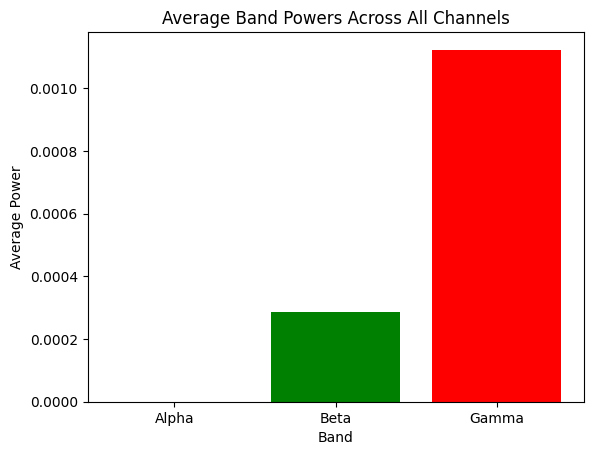

In [104]:
# Plot the average band powers
plot_average_band_powers(avg_band_power)